<a href="https://colab.research.google.com/github/SghaierOussama/Data-Analysis-Project/blob/main/Oussama_Sghaier_INSE_6620Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Multiclass Classification with PyCaret**

Multiclass classification is a supervised machine learning technique where the goal is to classify instances into one of three or more classes. (Classifying instances into one of two classes is called Binary Classification).

**Install Pycaret**

In [2]:
# install slim version (default): if you get an error message, run it again
!pip install pycaret

**Import Libraries**

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [4]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.3.5
Seaborn version:  0.11.2


**Dataset**


This Dataset was collected for rice classification. It is a perfect dataset to learn the classification thanks to its simplicity.

The data set can be used for the tasks of classification and cluster analysis.


Attribute Information:

To construct the data, ten geometric parameters of wheat kernels were measured:

1. Area
2. MajorAxisLength
3. MinorAxisLength
4. Eccentricity
5. ConvexArea
6. EquivDiameter
7. Extent
8. Perimeter
9. Roundness
10. AspectRation

All of these parameters were real-valued continuous.

https://www.kaggle.com/datasets/mssmartypants/rice-type-classification

In [5]:
#read cvs file into dataframe
df = pd.read_csv('/content/riceClassification.csv')
df.drop(columns=["id"],inplace = True)
df.head(25)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1
5,2990,77.417073,50.954344,0.752861,3080,61.700780,0.584898,216.930,0.798439,1.519342,1
6,3556,84.323564,55.413061,0.753762,3636,67.287739,0.750211,227.007,0.867148,1.521727,1
7,3788,86.952411,56.444769,0.760664,3866,69.448048,0.800676,235.476,0.858473,1.540487,1
8,2629,74.133114,48.074144,0.761228,2790,57.856260,0.640595,207.325,0.768594,1.542058,1
9,5719,106.721142,68.977700,0.763053,5819,85.332625,0.754983,281.839,0.904748,1.547183,1


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18185 entries, 0 to 18184
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             18185 non-null  int64  
 1   MajorAxisLength  18185 non-null  float64
 2   MinorAxisLength  18185 non-null  float64
 3   Eccentricity     18185 non-null  float64
 4   ConvexArea       18185 non-null  int64  
 5   EquivDiameter    18185 non-null  float64
 6   Extent           18185 non-null  float64
 7   Perimeter        18185 non-null  float64
 8   Roundness        18185 non-null  float64
 9   AspectRation     18185 non-null  float64
 10  Class            18185 non-null  int64  
dtypes: float64(8), int64(3)
memory usage: 1.5 MB


In [7]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [8]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

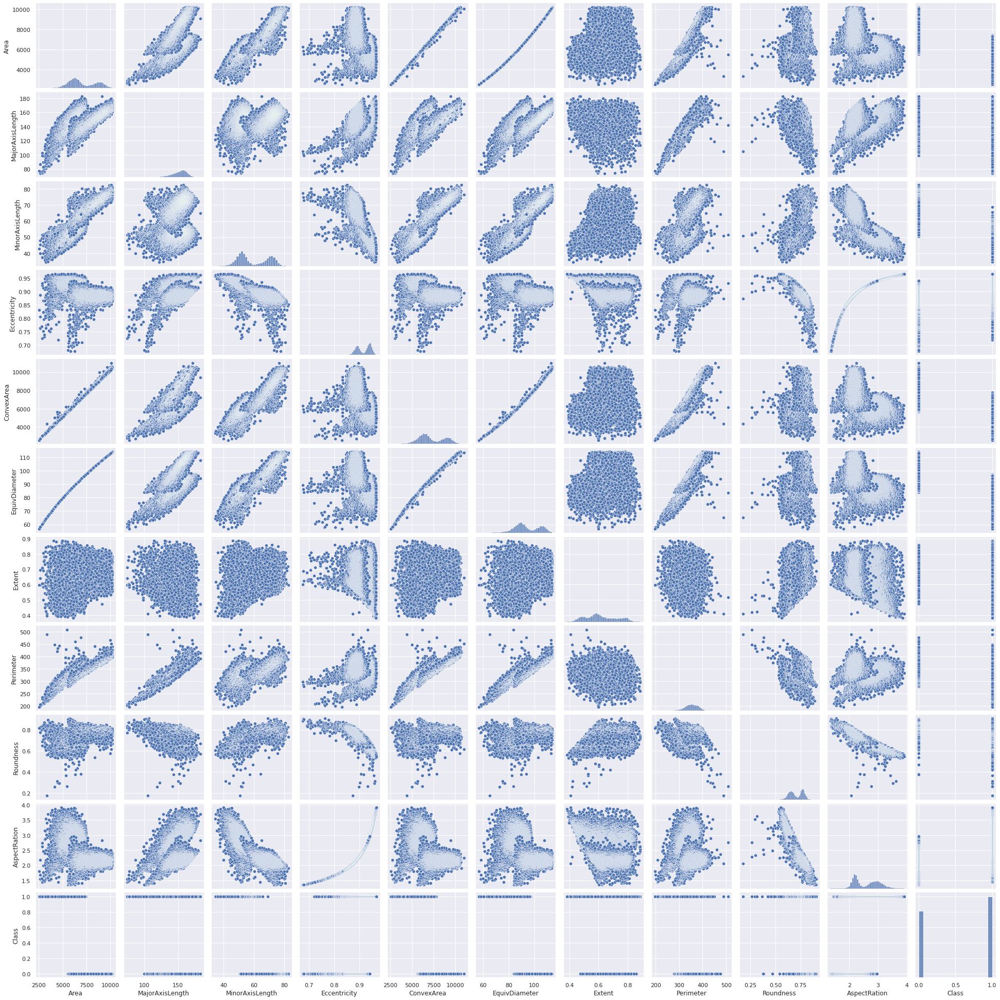

In [9]:
sns.pairplot(df)
plt.savefig("Correlation.png",bbox_inches='tight')
plt.show()

1    9985
0    8200
Name: Class, dtype: int64


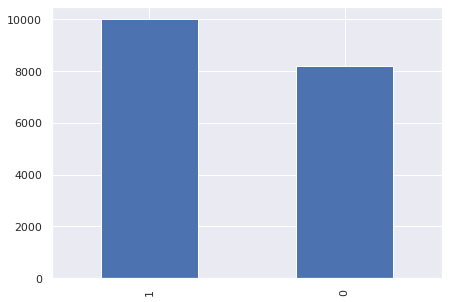

In [10]:
y =df['Class']
print(y.value_counts())
y.value_counts().plot(kind='bar')
plt.ylabel('')
plt.show()

**Data Matrix**

In [11]:
X = df.iloc[:,:10]
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation
0,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796
1,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137
2,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950
3,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456
4,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000
5,2990,77.417073,50.954344,0.752861,3080,61.700780,0.584898,216.930,0.798439,1.519342
6,3556,84.323564,55.413061,0.753762,3636,67.287739,0.750211,227.007,0.867148,1.521727
7,3788,86.952411,56.444769,0.760664,3866,69.448048,0.800676,235.476,0.858473,1.540487
8,2629,74.133114,48.074144,0.761228,2790,57.856260,0.640595,207.325,0.768594,1.542058
9,5719,106.721142,68.977700,0.763053,5819,85.332625,0.754983,281.839,0.904748,1.547183


In [12]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,18185.0,7036.492989,1467.197150,2522.000000,5962.000000,6660.000000,8423.000000,10210.000000
MajorAxisLength,18185.0,151.680754,12.376402,74.133114,145.675910,153.883750,160.056214,183.211434
MinorAxisLength,18185.0,59.807851,10.061653,34.409894,51.393151,55.724288,70.156593,82.550762
Eccentricity,18185.0,0.915406,0.030575,0.676647,0.891617,0.923259,0.941372,0.966774
ConvexArea,18185.0,7225.817872,1502.006571,2579.000000,6125.000000,6843.000000,8645.000000,11008.000000
EquivDiameter,18185.0,94.132952,9.906250,56.666658,87.126656,92.085696,103.559146,114.016559
Extent,18185.0,0.616653,0.104389,0.383239,0.538530,0.601194,0.695664,0.886573
Perimeter,18185.0,351.606949,29.500620,197.015000,333.990000,353.088000,373.003000,508.511000
Roundness,18185.0,0.707998,0.067310,0.174590,0.650962,0.701941,0.769280,0.904748
AspectRation,18185.0,2.599081,0.434836,1.358128,2.208527,2.602966,2.964101,3.911845


**Standardize the Data**

In [13]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation
0,-1.703630,-4.803744,0.417927,-6.393938,-1.696989,-1.830049,0.391654,-2.661778,0.839588,-2.663800
1,-2.838478,-6.220789,-0.835611,-6.209583,-2.803539,-3.398143,0.923070,-4.857318,1.837215,-2.635418
2,-2.718519,-6.091404,-0.771700,-6.024520,-2.725641,-3.213879,1.365122,-4.799860,2.383587,-2.605950
3,-2.701479,-6.031573,-0.783130,-5.781578,-2.708996,-3.188141,1.598635,-4.777995,2.409877,-2.565690
4,-2.278893,-5.377799,-0.341288,-5.433479,-2.279559,-2.580390,1.463045,-4.111042,2.477331,-2.504645
5,-2.758051,-6.000590,-0.879950,-5.316410,-2.760262,-3.274000,-0.304202,-4.565350,1.343680,-2.483161
6,-2.372271,-5.442538,-0.436798,-5.286951,-2.390080,-2.710001,1.279457,-4.223754,2.364484,-2.477675
7,-2.214142,-5.230124,-0.334257,-5.061184,-2.236948,-2.491920,1.762905,-3.936668,2.235600,-2.434533
8,-3.004105,-6.265938,-1.166213,-5.042738,-2.953342,-3.662101,0.229356,-4.890945,0.900273,-2.430919
9,-0.897991,-3.632788,0.911391,-4.983052,-0.936651,-0.888385,1.325177,-2.365031,2.923116,-2.419132


In [14]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,18185.0,-8.076758e-16,1.000027,-3.077035,-0.732364,-0.256614,0.945030,2.163032
MajorAxisLength,18185.0,-1.668888e-15,1.000027,-6.265938,-0.485198,0.178005,0.676747,2.547715
MinorAxisLength,18185.0,1.601768e-15,1.000027,-2.524303,-0.836337,-0.405865,1.028561,2.260418
Eccentricity,18185.0,-2.513805e-15,1.000027,-7.809152,-0.778086,0.256851,0.849263,1.680082
ConvexArea,18185.0,4.790718e-17,1.000027,-3.093825,-0.732918,-0.254878,0.944883,2.518156
EquivDiameter,18185.0,-1.783182e-15,1.000027,-3.782190,-0.707280,-0.206669,0.951566,2.007233
Extent,18185.0,-6.212365e-16,1.000027,-2.236051,-0.748401,-0.148095,0.756913,2.585776
Perimeter,18185.0,-2.687173e-15,1.000027,-5.240439,-0.597189,0.050205,0.725295,5.318816
Roundness,18185.0,4.781865e-16,1.000027,-7.924849,-0.847385,-0.089998,0.910465,2.923116
AspectRation,18185.0,-5.107026e-16,1.000027,-2.853917,-0.898188,0.008934,0.839464,3.019065


**Observations and variables**

In [15]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

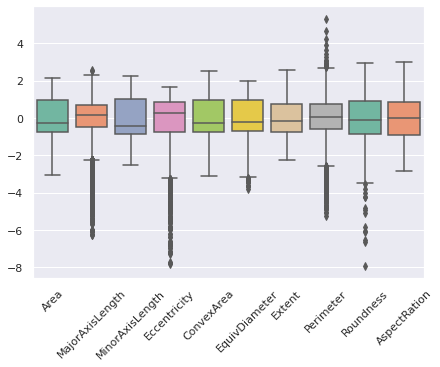

In [16]:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

In [17]:
X.columns

Index(['Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity',
       'ConvexArea', 'EquivDiameter', 'Extent', 'Perimeter', 'Roundness',
       'AspectRation'],
      dtype='object')

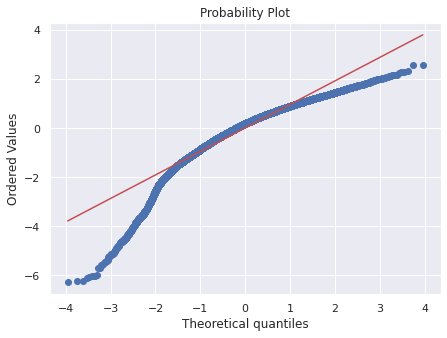

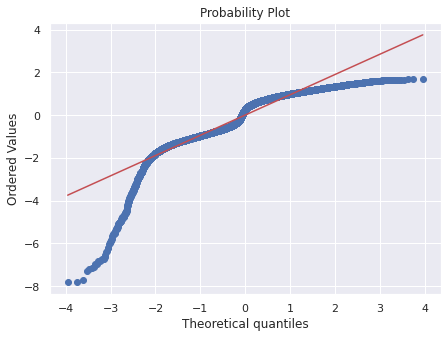

In [18]:
from scipy import stats
for elem in ["MajorAxisLength","Eccentricity"]:
  stats.probplot(X[elem], plot=plt)
  plt.show()

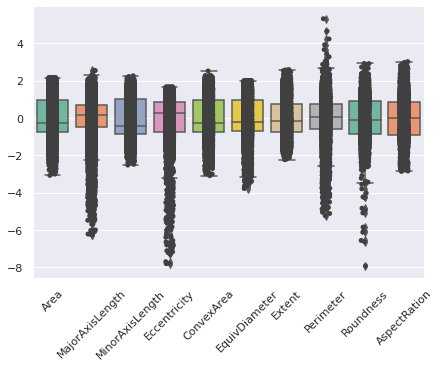

In [19]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()
ax = plt.figure()    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

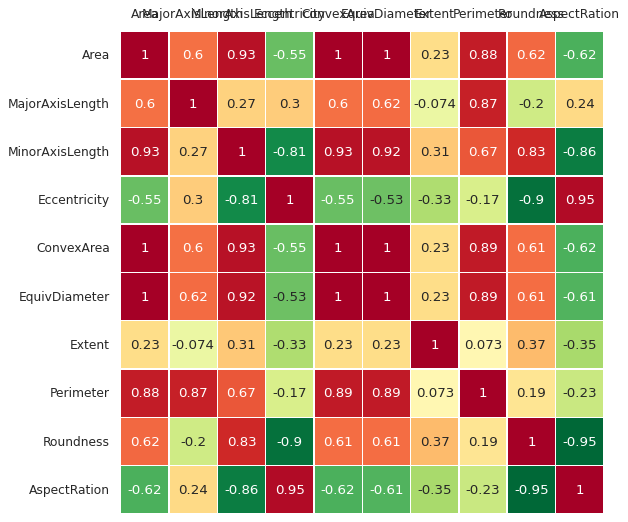

In [20]:
from matplotlib.pyplot import figure

figure(figsize=(10, 8), dpi=80)
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

#X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
#sns.clustermap(X.corr(), annot=True, fmt='.2f')

##**Principal Component Analysis (PCA)**

Text(0, 0.5, '$Z_2$')

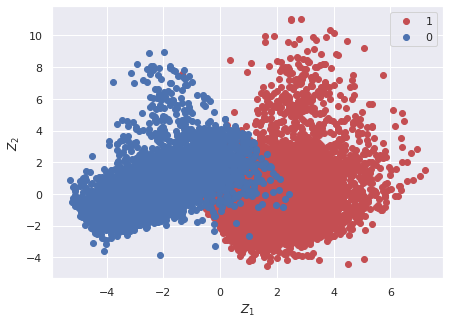

In [21]:
pca = PCA()
Z = pca.fit_transform(X)

idx_1 = np.where(y == 1)
idx_2 = np.where(y == 0)

plt. figure()
plt.scatter(Z[idx_1,0], Z[idx_1,1], c='r', label=1)
plt.scatter(Z[idx_2,0], Z[idx_2,1], c='b', label=0)
plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

In [22]:
print(Z)
print(Z.shape)

[[ 3.54083188e-01  8.44244654e+00 -1.35574232e+00 ... -1.20681583e-01
  -2.11701335e-01 -7.32155562e-02]
 [ 2.85491984e+00  1.10137452e+01 -9.31820226e-01 ...  1.71027998e-01
  -7.69562848e-02 -3.96286832e-02]
 [ 2.48280546e+00  1.10566003e+01 -5.15969267e-01 ...  3.08080767e-01
  -6.69635441e-02 -5.00516723e-02]
 ...
 [ 1.48825346e+00 -6.62738915e-01 -1.97156171e-01 ...  2.54651593e-02
   2.78955270e-03 -2.17383221e-02]
 [ 2.20307787e+00 -8.04845372e-01 -7.73643128e-01 ... -3.40904561e-02
   1.15415471e-02 -4.01515545e-03]
 [ 1.96980776e+00 -7.10837722e-01 -8.27180603e-01 ...  2.08927748e-02
  -4.86658807e-03 -1.59282013e-02]]
(18185, 10)


**Eigenvectors**

[[-3.82711630e-01 -1.54080516e-01 -1.85952483e-02 -9.47182662e-02
   4.86722024e-02  4.25135577e-01 -2.63757801e-01  1.63361821e-01
  -4.92808717e-01  5.46121538e-01]
 [-1.53667795e-01 -5.63744588e-01  9.79499107e-02 -1.93224954e-01
  -3.79695762e-01 -4.53584819e-01 -3.45618750e-01 -3.12732230e-01
   1.48039599e-01  1.50235247e-01]
 [-3.92051947e-01  6.92364875e-02 -7.07274017e-02  7.83622592e-02
   7.48669016e-02  1.46119325e-01  5.15517900e-01 -5.42974618e-01
   3.41571430e-01  3.55178092e-01]
 [ 2.91012186e-01 -3.87247843e-01  1.37661138e-01 -5.45394886e-01
   6.42874661e-01  4.26434089e-02  1.59920781e-01 -2.51651507e-02
   6.53244736e-02  5.79941944e-02]
 [-3.82111043e-01 -1.57654605e-01 -2.00274120e-02 -3.09522649e-02
   1.04730661e-01  4.77527614e-01 -3.57657601e-01  9.04436745e-02
   5.09537291e-01 -4.39373001e-01]
 [-3.80981420e-01 -1.65920570e-01 -1.51285516e-02 -1.00919073e-01
   2.74335150e-02 -5.94312778e-02  2.72028963e-01 -2.56907689e-01
  -5.67619325e-01 -5.91973225e-01

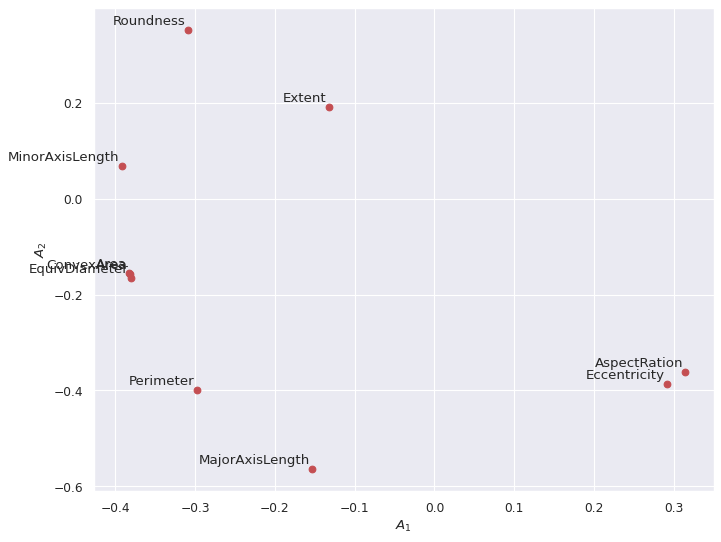

In [23]:
A = pca.components_.T 
print(A)
figure(figsize=(10, 8), dpi=80)
plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

/usr/local/lib/python3.7/dist-packages/matplotlib/collections.py:885: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


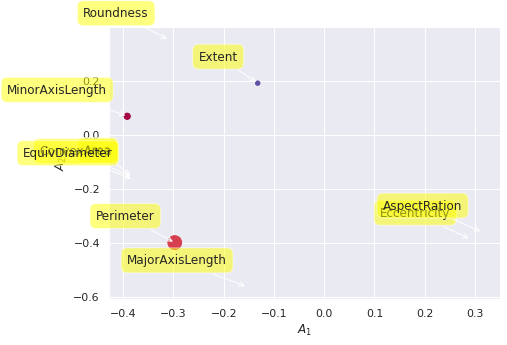

In [24]:
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree plot**

[6.38246162e+00 2.60627856e+00 8.38749613e-01 1.14902472e-01
 4.48562668e-02 8.59683693e-03 2.57994437e-03 1.54518501e-03
 4.01613916e-04 1.77825801e-04]


Text(0, 0.5, 'Explained variance')

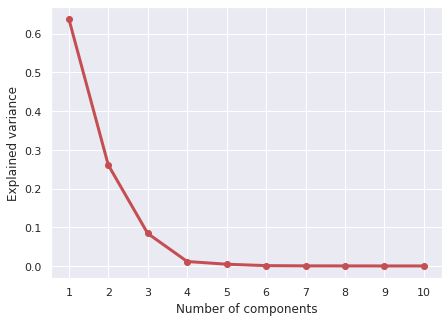

In [25]:
#Eigenvalues
Lambda = pca.explained_variance_ 
print(Lambda)
#Scree plot
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

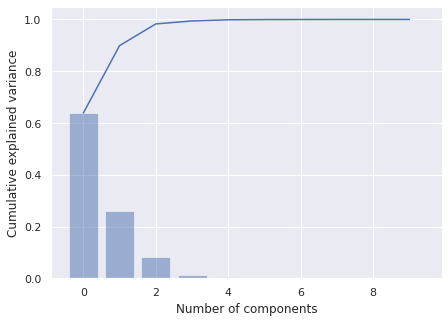

In [26]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

<Figure size 504x360 with 0 Axes>

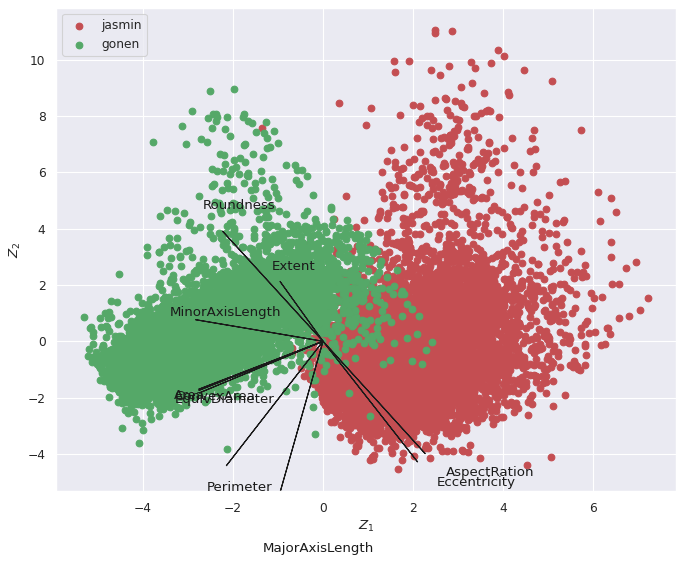

In [27]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]

plt.figure()
figure(figsize=(10, 8), dpi=80)
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_1,0], Z[idx_1,1], c='r', label='jasmin')
plt.scatter(Z[idx_2,0], Z[idx_2,1], c='g', label='gonen')
plt.legend(loc='upper left')

##**Using PCA Library**

In [28]:
!pip install pca

  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=f5becc653d15ee1c2e4bea18c21db2ad24883dfa8c9546ed7571dd74f8bcc31c
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget


In [29]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [10] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [10] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


**Principal Components**

In [30]:
out['PC']

,PC1,PC2,PC3
0,0.354083,8.442447,-1.355742
1,2.854920,11.013745,-0.931820
2,2.482805,11.056600,-0.515969
3,2.493232,10.949386,-0.246925
4,1.581389,9.952350,-0.305457
...,...,...,...
18180,2.294296,-0.298537,-0.786845
18181,-0.224148,-2.334744,0.724407
18182,1.488253,-0.662739,-0.197156
18183,2.203078,-0.804845,-0.773643


**Scatter plot**

[pca] >Set parameter "label=None" to ignore the labels and significanly speed up the scatter plot.


(<Figure size 1440x1080 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7faacc896d50>)

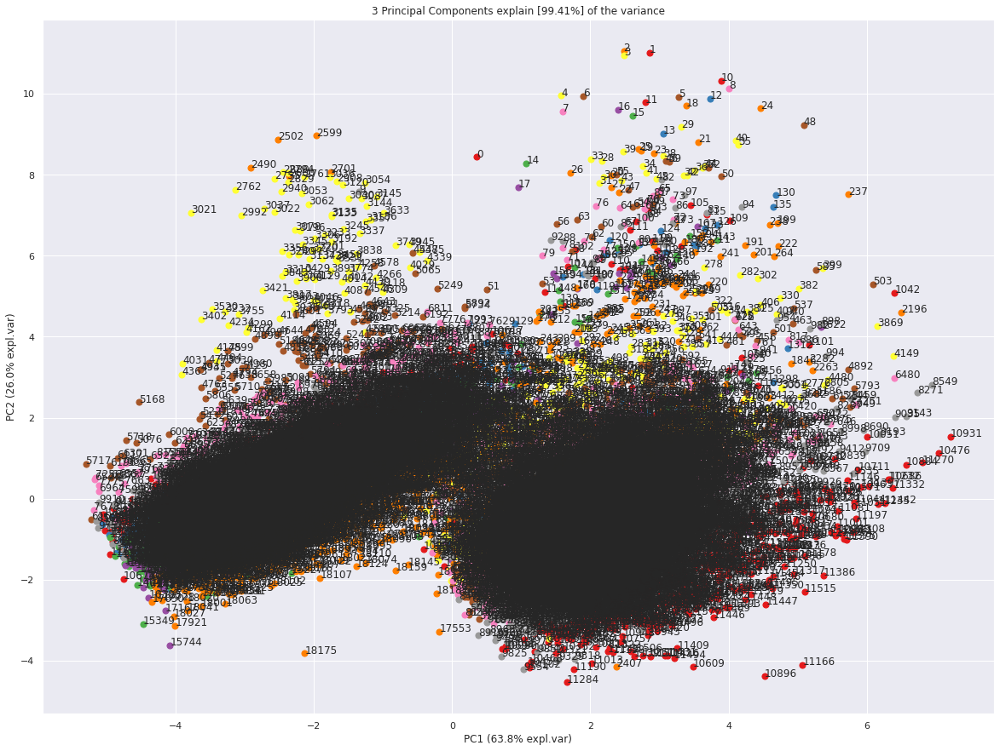

In [31]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [32]:
A = out['loadings'].T

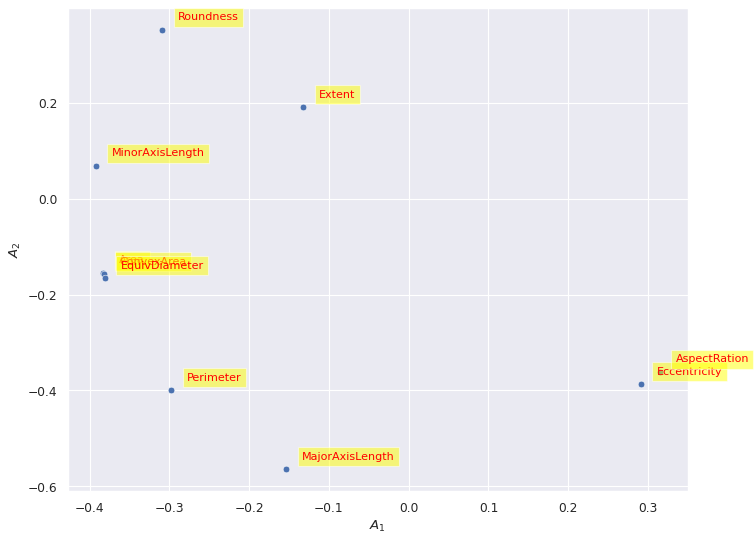

In [33]:
figure(figsize=(10, 8), dpi=80)
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

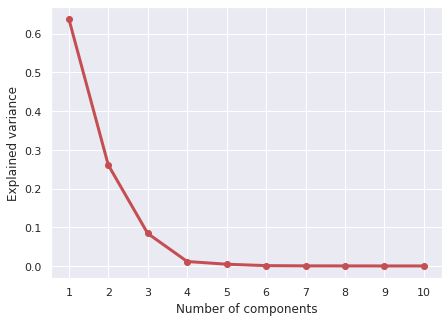

In [34]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

**Explained Variance Plot**

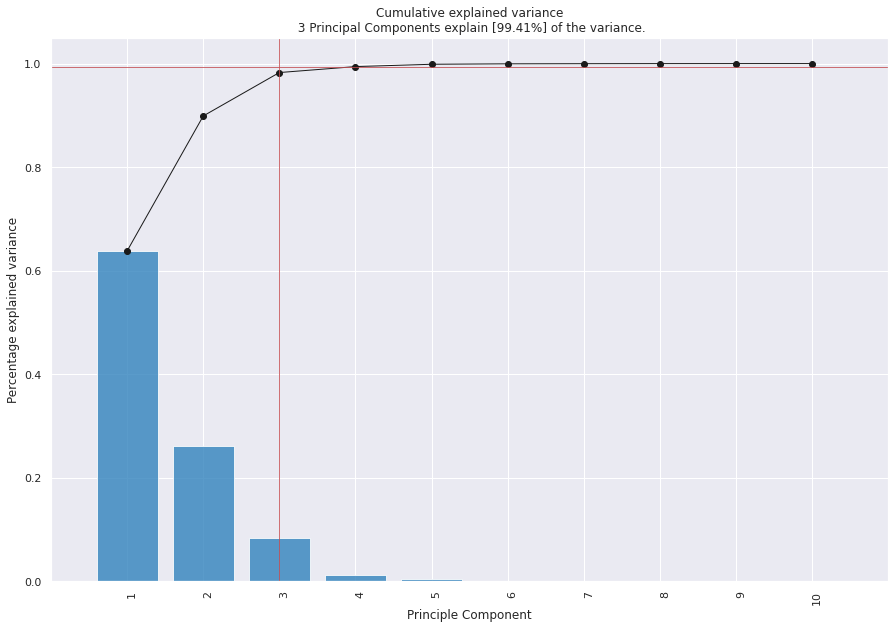

<Figure size 504x360 with 0 Axes>

In [35]:
model.plot();

**Biplot**

[pca] >Plot PC1 vs PC2 with loadings.
[pca] >Set parameter "label=None" to ignore the labels and significanly speed up the scatter plot.


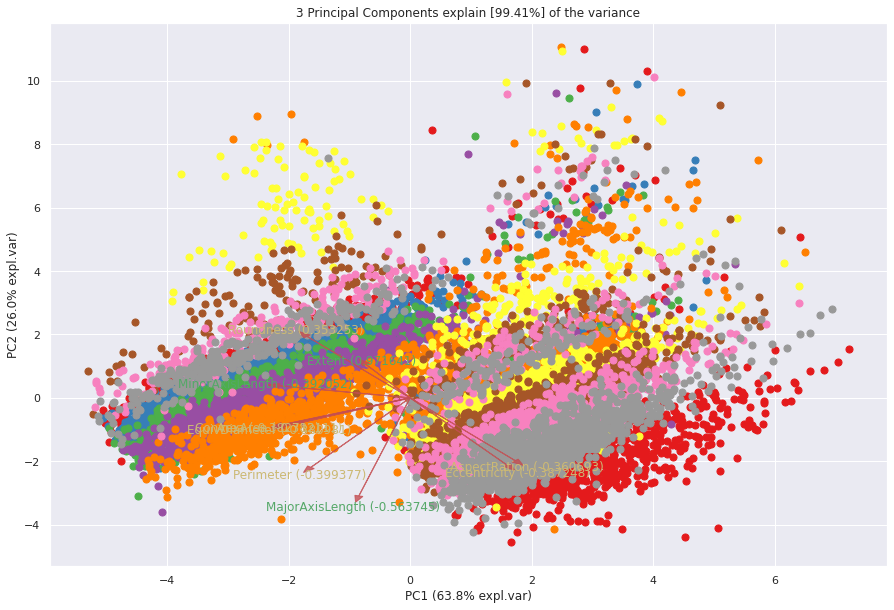

(<Figure size 1080x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7faac3123390>)

In [36]:
model.biplot(label=False, legend=False)

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.
[pca] >Set parameter "label=None" to ignore the labels and significanly speed up the scatter plot.


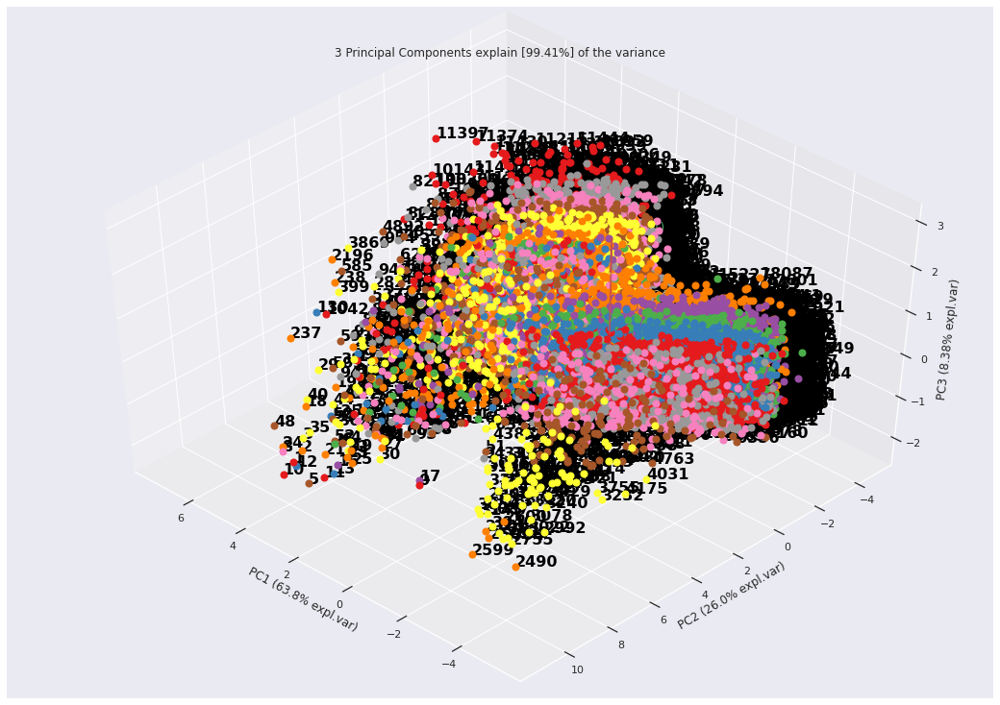

(<Figure size 1080x720 with 2 Axes>,
 <mpl_toolkits.mplot3d.axes3d.Axes3D at 0x7faaaebe3290>)

In [37]:
model.biplot3d(legend=False)

#**Classification Original Dataset**

**Using PyCaret**

In [38]:
#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'2.3.10'

PyCaret uses interactive plotting ability. In order to render interactive plots in Google Colab, run the below line of code in your colab notebook.

In [39]:
#For Google Colab only
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In order to demonstrate the predict_model() function on unseen data, a sample of 21 observations has been withheld from the original dataset to be used for predictions. This should not be confused with a train/test split as this particular split is performed to simulate a real life scenario. Another way to think about this is that these 21 records were not available at the time when the machine learning experiment was performed.

In [40]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (16366, 11)
Unseen Data For Predictions: (1819, 11)


**Setting up the Environment in PyCaret**

The setup() function initializes the environment in pycaret and creates the transformation pipeline to prepare the data for modeling and deployment. setup() must be called before executing any other function in pycaret. It takes two mandatory parameters: a pandas dataframe and the name of the target column. All other parameters are optional and are used to customize the pre-processing pipeline (we will see them in later tutorials).

When setup() is executed, PyCaret's inference algorithm will automatically infer the data types for all features based on certain properties. The data type should be inferred correctly but this is not always the case. To account for this, PyCaret displays a table containing the features and their inferred data types after setup() is executed. If all of the data types are correctly identified enter can be pressed to continue or quit can be typed to end the expriment. Ensuring that the data types are correct is of fundamental importance in PyCaret as it automatically performs a few pre-processing tasks which are imperative to any machine learning experiment. These tasks are performed differently for each data type which means it is very important for them to be correctly configured.

In [42]:
from pycaret.classification import *
clf = setup(data=data, target='Class', train_size=0.7, session_id=123)

,Description,Value
0,session_id,123
1,Target,Class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(16366, 11)"
5,Missing Values,False
6,Numeric Features,10
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


Once the setup has been succesfully executed it prints the information grid which contains several important pieces of information. Most of the information is related to the pre-processing pipeline which is constructed when setup() is executed. The majority of these features are out of scope for the purposes of this tutorial however a few important things to note at this stage include:

* **session_id** : A pseduo-random number distributed as a seed in all functions for later reproducibility. If no session_id is passed, a random number is automatically generated that is distributed to all functions. In this experiment, the session_id is set as 123 for later reproducibility.

* **Target Type** : Binary or Multiclass. The Target type is automatically detected and shown. There is no difference in how the experiment is performed for Binary or Multiclass problems. All functionalities are identical.

* **Label Encoded** : When the Target variable is of type string (i.e. 'Yes' or 'No') instead of 1 or 0, it automatically encodes the label into 1 and 0 and displays the mapping (0 : No, 1 : Yes) for reference. 

* **Original Data** : Displays the original shape of the dataset. In this experiment (189, 8) means 189 samples and 8 features including the class column.

* **Missing Values** : When there are missing values in the original data this will show as True. For this experiment there are no missing values in the dataset.

* **Numeric Features** : The number of features inferred as numeric. In this dataset, 7 out of 8 features are inferred as numeric.

* **Categorical Features** : The number of features inferred as categorical. In this dataset, there are no categorical features.

* **Transformed Train Set** : Displays the shape of the transformed training set. Notice that the original shape of (189, 8) is transformed into (132, 7) for the transformed train set.

* **Transformed Test Set** : Displays the shape of the transformed test/hold-out set. There are 57 samples in test/hold-out set. This split is based on the default value of 70/30 that can be changed using the train_size parameter in setup.

Notice how a few tasks that are imperative to perform modeling are automatically handled such as missing value imputation, categorical encoding etc. Most of the parameters in setup() are optional and used for customizing the pre-processing pipeline. 

**Comparing All Models**

In [43]:
 #show the best model and their statistics
 best_model = compare_models() 

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9900,0.9991,0.9928,0.9890,0.9909,0.9799,0.9799,0.467
et,Extra Trees Classifier,0.9895,0.9984,0.9923,0.9886,0.9904,0.9789,0.9789,0.603
ada,Ada Boost Classifier,0.9893,0.9985,0.9909,0.9896,0.9903,0.9785,0.9785,0.517
rf,Random Forest Classifier,0.9888,0.9986,0.9920,0.9876,0.9898,0.9774,0.9775,1.169
gbc,Gradient Boosting Classifier,0.9887,0.9987,0.9917,0.9876,0.9896,0.9771,0.9771,1.990
lightgbm,Light Gradient Boosting Machine,0.9887,0.9991,0.9915,0.9878,0.9897,0.9771,0.9771,0.179
knn,K Neighbors Classifier,0.9881,0.9955,0.9904,0.9879,0.9892,0.9760,0.9761,0.138
qda,Quadratic Discriminant Analysis,0.9875,0.9983,0.9891,0.9880,0.9886,0.9748,0.9748,0.018
nb,Naive Bayes,0.9864,0.9987,0.9943,0.9811,0.9876,0.9725,0.9726,0.017
lda,Linear Discriminant Analysis,0.9847,0.9989,0.9970,0.9757,0.9862,0.9691,0.9694,0.026


In [44]:
best_model

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Create a Model**

create_model is the most granular function in PyCaret and is often the foundation behind most of the PyCaret functionalities. As the name suggests this function trains and evaluates a model using cross validation that can be set with fold parameter. The output prints a score grid that shows Accuracy, Recall, Precision, F1, Kappa and MCC by fold.

For the remaining part of this tutorial, we will work with the below models as our candidate models. The selections are for illustration purposes only and do not necessarily mean they are the top performing or ideal for this type of data.

* Support Vector Machine ('svm')
* K Neighbors Classifier ('knn')
* Logistic Regression ('lr')

There are many classifiers available in the model library of PyCaret. Please view the create_model() docstring for the list of all available models.

**Create SVM Classifier**

In [45]:
svm = create_model('svm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9712,0.0,0.9601,0.9869,0.9733,0.9421,0.9425
1,0.9869,0.0,0.9904,0.9857,0.9881,0.9736,0.9736
2,0.9773,0.0,0.9649,0.9934,0.9790,0.9544,0.9548
3,0.8944,0.0,0.8070,1.0000,0.8932,0.7911,0.8090
4,0.9660,0.0,0.9777,0.9608,0.9692,0.9312,0.9314
5,0.8665,0.0,0.9920,0.8078,0.8905,0.7240,0.7494
6,0.9659,0.0,0.9745,0.9637,0.9691,0.9312,0.9312
7,0.9712,0.0,0.9569,0.9901,0.9732,0.9421,0.9427
8,0.9590,0.0,0.9585,0.9662,0.9623,0.9172,0.9173


In [46]:
#trained model object is stored in the variable 'svm'. 
svm

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.001, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=-1, penalty='l2',
              power_t=0.5, random_state=123, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)

**Tune a Model:** How to automatically tune the hyper-parameters of a multiclass model. When a model is created using the create_model() function it uses the default hyperparameters. In order to tune hyperparameters, the tune_model() function is used. The tune_model() function is a random grid search of hyperparameters over a pre-defined search space. By default, it is set to optimize Accuracy but this can be changed using optimize parameter. This function automatically tunes the hyperparameters of a model on a pre-defined search space and scores it using stratified cross validation. The output prints a score grid that shows Accuracy, AUC, Recall, Precision, F1 and Kappa by fold.

**Tune SVM Model**

In [47]:
tuned_svm = tune_model(svm)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9799,0.0,0.9793,0.9840,0.9816,0.9595,0.9595
1,0.9887,0.0,0.9904,0.9889,0.9896,0.9771,0.9771
2,0.9860,0.0,0.9888,0.9857,0.9873,0.9718,0.9718
3,0.9860,0.0,0.9936,0.9811,0.9873,0.9718,0.9719
4,0.9764,0.0,0.9777,0.9792,0.9785,0.9525,0.9525
5,0.9799,0.0,0.9841,0.9794,0.9817,0.9595,0.9595
6,0.9817,0.0,0.9825,0.9840,0.9832,0.9630,0.9630
7,0.9834,0.0,0.9824,0.9872,0.9848,0.9665,0.9665
8,0.9773,0.0,0.9728,0.9854,0.9791,0.9542,0.9543


In [48]:
#tuned model object is stored in the variable 'tuned_svm'. 
tuned_svm

SGDClassifier(alpha=1e-07, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.5, fit_intercept=True,
              l1_ratio=0.7700000001, learning_rate='adaptive', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=-1,
              penalty='elasticnet', power_t=0.5, random_state=123, shuffle=True,
              tol=0.001, validation_fraction=0.1, verbose=0, warm_start=False)

**Evaluate SVM Model**

Update statmodels

In [50]:
!pip install statsmodels --upgrade

How to analyze model performance using various plots

In [51]:
evaluate_model(tuned_svm)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create K Neighbors Model**

In [52]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9825,0.9957,0.9856,0.9825,0.9841,0.9648,0.9648
1,0.9948,0.9981,0.9952,0.9952,0.9952,0.9894,0.9894
2,0.9939,0.9979,0.9968,0.9921,0.9944,0.9877,0.9877
3,0.9834,0.9955,0.9888,0.9810,0.9849,0.9665,0.9666
4,0.9878,0.9942,0.9904,0.9873,0.9889,0.9753,0.9753
5,0.9904,0.9959,0.9952,0.9873,0.9913,0.9806,0.9807
6,0.9860,0.9962,0.9872,0.9872,0.9872,0.9718,0.9718
7,0.9878,0.9955,0.9840,0.9935,0.9888,0.9754,0.9754
8,0.9860,0.9942,0.9920,0.9826,0.9873,0.9718,0.9718


**Tune K Neighbors Model**

In [53]:
tuned_knn = tune_model(knn, custom_grid = {'n_neighbors' : np.arange(0,50,1)})

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9860,0.9975,0.9904,0.9842,0.9873,0.9718,0.9718
1,0.9948,0.9981,0.9952,0.9952,0.9952,0.9894,0.9894
2,0.9913,0.9988,0.9936,0.9905,0.9920,0.9824,0.9824
3,0.9869,0.9973,0.9904,0.9857,0.9881,0.9736,0.9736
4,0.9887,0.9975,0.9904,0.9889,0.9896,0.9771,0.9771
5,0.9904,0.9986,0.9968,0.9858,0.9913,0.9806,0.9807
6,0.9886,0.9987,0.9920,0.9873,0.9897,0.9771,0.9771
7,0.9895,0.9986,0.9888,0.9920,0.9904,0.9789,0.9789
8,0.9895,0.9948,0.9936,0.9873,0.9904,0.9788,0.9789


**Evaluate K Neighbors Model**

In [54]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Logistic Regression Model**

In [55]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9860,0.9970,0.9904,0.9842,0.9873,0.9718,0.9718
1,0.9956,0.9995,0.9968,0.9952,0.9960,0.9912,0.9912
2,0.9921,0.9996,0.9952,0.9905,0.9928,0.9841,0.9842
3,0.9895,0.9995,0.9952,0.9858,0.9905,0.9788,0.9789
4,0.9887,0.9995,0.9920,0.9873,0.9897,0.9771,0.9771
5,0.9930,0.9989,0.9968,0.9905,0.9936,0.9859,0.9859
6,0.9904,0.9997,0.9920,0.9904,0.9912,0.9806,0.9806
7,0.9869,0.9993,0.9840,0.9919,0.9880,0.9736,0.9736
8,0.9895,0.9987,0.9936,0.9873,0.9904,0.9788,0.9789


**Tune Logistic Regression Model**

In [56]:
tuned_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9860,0.9970,0.9904,0.9842,0.9873,0.9718,0.9718
1,0.9956,0.9995,0.9968,0.9952,0.9960,0.9912,0.9912
2,0.9921,0.9997,0.9952,0.9905,0.9928,0.9841,0.9842
3,0.9895,0.9995,0.9952,0.9858,0.9905,0.9788,0.9789
4,0.9887,0.9995,0.9920,0.9873,0.9897,0.9771,0.9771
5,0.9930,0.9989,0.9968,0.9905,0.9936,0.9859,0.9859
6,0.9904,0.9997,0.9920,0.9904,0.9912,0.9806,0.9806
7,0.9869,0.9993,0.9840,0.9919,0.9880,0.9736,0.9736
8,0.9895,0.9986,0.9936,0.9873,0.9904,0.9788,0.9789


**Evaluate Logistic Regression Model**

In [57]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

#**Classification + PCA (All PC)**

In [58]:
clf_pca = setup(data=data, target='Class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 8)

,Description,Value
0,session_id,123
1,Target,Class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(16366, 11)"
5,Missing Values,False
6,Numeric Features,10
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [59]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9904,0.9986,0.9941,0.9884,0.9912,0.9806,0.9806,1.304
et,Extra Trees Classifier,0.9903,0.9990,0.9936,0.9887,0.9912,0.9804,0.9805,0.647
lightgbm,Light Gradient Boosting Machine,0.9903,0.9992,0.9938,0.9886,0.9912,0.9804,0.9805,0.171
ada,Ada Boost Classifier,0.9896,0.9990,0.9933,0.9878,0.9905,0.9790,0.9791,0.532
lr,Logistic Regression,0.9894,0.9990,0.9925,0.9881,0.9903,0.9785,0.9785,0.043
svm,SVM - Linear Kernel,0.9893,0.0000,0.9936,0.9869,0.9902,0.9783,0.9784,0.023
gbc,Gradient Boosting Classifier,0.9889,0.9982,0.9914,0.9884,0.9899,0.9776,0.9776,2.055
knn,K Neighbors Classifier,0.9887,0.9949,0.9914,0.9881,0.9897,0.9773,0.9773,0.138
qda,Quadratic Discriminant Analysis,0.9875,0.9983,0.9891,0.9880,0.9886,0.9748,0.9748,0.018
nb,Naive Bayes,0.9852,0.9978,0.9970,0.9764,0.9866,0.9700,0.9703,0.017


**SVM**

In [60]:
svm = create_model('svm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9860,0.0,0.9920,0.9826,0.9873,0.9718,0.9719
1,0.9956,0.0,0.9984,0.9937,0.9960,0.9912,0.9912
2,0.9930,0.0,0.9968,0.9905,0.9936,0.9859,0.9859
3,0.9913,0.0,0.9984,0.9858,0.9921,0.9824,0.9825
4,0.9887,0.0,0.9920,0.9873,0.9897,0.9771,0.9771
5,0.9895,0.0,0.9968,0.9843,0.9905,0.9788,0.9789
6,0.9904,0.0,0.9952,0.9873,0.9913,0.9806,0.9806
7,0.9852,0.0,0.9904,0.9826,0.9865,0.9700,0.9701
8,0.9860,0.0,0.9856,0.9888,0.9872,0.9718,0.9718


In [61]:
tuned_svm = tune_model(svm)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9834,0.0,0.9856,0.9841,0.9849,0.9665,0.9665
1,0.9956,0.0,0.9952,0.9968,0.9960,0.9912,0.9912
2,0.9930,0.0,0.9968,0.9905,0.9936,0.9859,0.9859
3,0.9913,0.0,0.9968,0.9874,0.9921,0.9824,0.9824
4,0.9887,0.0,0.9920,0.9873,0.9897,0.9771,0.9771
5,0.9930,0.0,0.9968,0.9905,0.9936,0.9859,0.9859
6,0.9921,0.0,0.9952,0.9905,0.9928,0.9841,0.9841
7,0.9869,0.0,0.9856,0.9904,0.9880,0.9736,0.9736
8,0.9895,0.0,0.9936,0.9873,0.9904,0.9788,0.9789


In [62]:
evaluate_model(tuned_svm)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**KNN**

In [63]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9817,0.9878,0.9872,0.9794,0.9833,0.9630,0.9630
1,0.9956,0.9981,0.9968,0.9952,0.9960,0.9912,0.9912
2,0.9930,0.9960,0.9952,0.9921,0.9936,0.9859,0.9859
3,0.9860,0.9959,0.9904,0.9842,0.9873,0.9718,0.9718
4,0.9895,0.9979,0.9904,0.9904,0.9904,0.9789,0.9789
5,0.9895,0.9951,0.9904,0.9904,0.9904,0.9789,0.9789
6,0.9904,0.9943,0.9920,0.9904,0.9912,0.9806,0.9806
7,0.9843,0.9978,0.9856,0.9856,0.9856,0.9683,0.9683
8,0.9895,0.9923,0.9936,0.9873,0.9904,0.9788,0.9789


In [64]:
tuned_knn = tune_model(knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9834,0.9972,0.9872,0.9825,0.9849,0.9665,0.9665
1,0.9965,0.9988,0.9984,0.9952,0.9968,0.9930,0.9930
2,0.9939,0.9986,0.9984,0.9905,0.9944,0.9877,0.9877
3,0.9878,0.9993,0.9936,0.9842,0.9889,0.9753,0.9754
4,0.9913,0.9995,0.9920,0.9920,0.9920,0.9824,0.9824
5,0.9930,0.9985,0.9968,0.9905,0.9936,0.9859,0.9859
6,0.9895,0.9994,0.9920,0.9889,0.9904,0.9788,0.9788
7,0.9869,0.9987,0.9872,0.9888,0.9880,0.9736,0.9736
8,0.9878,0.9963,0.9920,0.9857,0.9889,0.9753,0.9753


In [65]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Logistic Regression**

In [66]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9860,0.9971,0.9920,0.9826,0.9873,0.9718,0.9719
1,0.9948,0.9993,0.9984,0.9921,0.9952,0.9894,0.9895
2,0.9930,0.9996,0.9968,0.9905,0.9936,0.9859,0.9859
3,0.9887,0.9993,0.9936,0.9858,0.9897,0.9771,0.9771
4,0.9878,0.9994,0.9888,0.9888,0.9888,0.9753,0.9753
5,0.9921,0.9987,0.9952,0.9905,0.9928,0.9841,0.9842
6,0.9895,0.9997,0.9920,0.9889,0.9904,0.9788,0.9788
7,0.9852,0.9992,0.9872,0.9856,0.9864,0.9700,0.9700
8,0.9869,0.9986,0.9888,0.9872,0.9880,0.9736,0.9736


In [67]:
tuned_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9869,0.9971,0.9920,0.9842,0.9881,0.9736,0.9736
1,0.9956,0.9994,0.9968,0.9952,0.9960,0.9912,0.9912
2,0.9930,0.9996,0.9968,0.9905,0.9936,0.9859,0.9859
3,0.9887,0.9994,0.9936,0.9858,0.9897,0.9771,0.9771
4,0.9878,0.9994,0.9904,0.9873,0.9889,0.9753,0.9753
5,0.9930,0.9988,0.9968,0.9905,0.9936,0.9859,0.9859
6,0.9895,0.9997,0.9920,0.9889,0.9904,0.9788,0.9788
7,0.9852,0.9993,0.9840,0.9888,0.9864,0.9701,0.9701
8,0.9886,0.9987,0.9920,0.9873,0.9896,0.9771,0.9771


In [68]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Note:** The AUC metric is not available for Multiclass classification however the column will still be shown with zero values to maintain consistency between the Binary Classification and Multiclass Classification display grids.

#**Classification + PCA (Number of PC =2)**

In [69]:
clf_pca = setup(data=data, target='Class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 2)

,Description,Value
0,session_id,123
1,Target,Class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(16366, 11)"
5,Missing Values,False
6,Numeric Features,10
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [70]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ada,Ada Boost Classifier,0.9878,0.9988,0.9927,0.9851,0.9889,0.9753,0.9754,0.280
knn,K Neighbors Classifier,0.9876,0.9951,0.9914,0.9861,0.9887,0.9750,0.9750,0.148
gbc,Gradient Boosting Classifier,0.9876,0.9982,0.9898,0.9876,0.9887,0.9750,0.9750,0.673
rf,Random Forest Classifier,0.9873,0.9975,0.9904,0.9863,0.9884,0.9743,0.9743,0.902
lightgbm,Light Gradient Boosting Machine,0.9870,0.9986,0.9898,0.9865,0.9881,0.9737,0.9738,0.105
et,Extra Trees Classifier,0.9868,0.9975,0.9896,0.9863,0.9880,0.9734,0.9734,0.568
qda,Quadratic Discriminant Analysis,0.9866,0.9988,0.9962,0.9798,0.9879,0.9730,0.9732,0.018
lr,Logistic Regression,0.9857,0.9983,0.9904,0.9835,0.9870,0.9711,0.9711,0.028
nb,Naive Bayes,0.9856,0.9986,0.9965,0.9776,0.9870,0.9709,0.9711,0.016
svm,SVM - Linear Kernel,0.9852,0.0000,0.9903,0.9828,0.9865,0.9700,0.9701,0.020


**SVM**

In [71]:
svm = create_model('svm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9808,0.0,0.9825,0.9825,0.9825,0.9613,0.9613
1,0.9887,0.0,0.9904,0.9889,0.9896,0.9771,0.9771
2,0.9913,0.0,0.9952,0.9889,0.9921,0.9824,0.9824
3,0.9808,0.0,0.9856,0.9794,0.9825,0.9612,0.9613
4,0.9869,0.0,0.9888,0.9873,0.9880,0.9736,0.9736
5,0.9869,0.0,0.9984,0.9781,0.9882,0.9735,0.9738
6,0.9869,0.0,0.9920,0.9842,0.9881,0.9735,0.9736
7,0.9773,0.0,0.9808,0.9777,0.9793,0.9542,0.9542
8,0.9860,0.0,0.9952,0.9796,0.9873,0.9718,0.9719


In [72]:
tuned_svm = tune_model(svm)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9869,0.0,0.9952,0.9811,0.9881,0.9735,0.9737
1,0.9878,0.0,0.9920,0.9857,0.9889,0.9753,0.9754
2,0.9930,0.0,0.9984,0.9889,0.9937,0.9859,0.9860
3,0.9808,0.0,0.9872,0.9779,0.9825,0.9612,0.9613
4,0.9843,0.0,0.9856,0.9856,0.9856,0.9683,0.9683
5,0.9913,0.0,0.9968,0.9874,0.9921,0.9824,0.9824
6,0.9869,0.0,0.9920,0.9842,0.9881,0.9735,0.9736
7,0.9764,0.0,0.9808,0.9762,0.9785,0.9524,0.9524
8,0.9834,0.0,0.9856,0.9841,0.9848,0.9665,0.9665


In [73]:
evaluate_model(tuned_svm)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**KNN**

In [74]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9843,0.9936,0.9888,0.9826,0.9857,0.9683,0.9683
1,0.9921,0.9981,0.9936,0.9920,0.9928,0.9841,0.9842
2,0.9965,0.9989,0.9968,0.9968,0.9968,0.9930,0.9930
3,0.9834,0.9947,0.9920,0.9780,0.9850,0.9665,0.9666
4,0.9895,0.9960,0.9904,0.9904,0.9904,0.9789,0.9789
5,0.9878,0.9959,0.9920,0.9857,0.9889,0.9753,0.9754
6,0.9869,0.9950,0.9904,0.9857,0.9881,0.9735,0.9736
7,0.9860,0.9942,0.9872,0.9872,0.9872,0.9718,0.9718
8,0.9825,0.9915,0.9936,0.9749,0.9842,0.9647,0.9649


In [75]:
tuned_knn = tune_model(knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9843,0.9952,0.9888,0.9826,0.9857,0.9683,0.9683
1,0.9948,0.9988,0.9952,0.9952,0.9952,0.9894,0.9894
2,0.9930,0.9998,0.9968,0.9905,0.9936,0.9859,0.9859
3,0.9869,0.9992,0.9936,0.9826,0.9881,0.9736,0.9736
4,0.9913,0.9994,0.9936,0.9905,0.9920,0.9824,0.9824
5,0.9904,0.9985,0.9936,0.9889,0.9912,0.9806,0.9806
6,0.9878,0.9991,0.9920,0.9857,0.9889,0.9753,0.9753
7,0.9869,0.9986,0.9888,0.9872,0.9880,0.9736,0.9736
8,0.9869,0.9961,0.9936,0.9826,0.9881,0.9735,0.9736


In [76]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Logistic Regression**

In [77]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9869,0.9970,0.9952,0.9811,0.9881,0.9735,0.9737
1,0.9869,0.9986,0.9904,0.9857,0.9881,0.9736,0.9736
2,0.9930,0.9994,0.9984,0.9889,0.9937,0.9859,0.9860
3,0.9808,0.9978,0.9872,0.9779,0.9825,0.9612,0.9613
4,0.9852,0.9988,0.9856,0.9872,0.9864,0.9701,0.9701
5,0.9913,0.9982,0.9968,0.9874,0.9921,0.9824,0.9824
6,0.9869,0.9991,0.9920,0.9842,0.9881,0.9735,0.9736
7,0.9764,0.9987,0.9808,0.9762,0.9785,0.9524,0.9524
8,0.9834,0.9969,0.9856,0.9841,0.9848,0.9665,0.9665


In [78]:
tuned_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9869,0.9969,0.9952,0.9811,0.9881,0.9735,0.9737
1,0.9869,0.9986,0.9904,0.9857,0.9881,0.9736,0.9736
2,0.9930,0.9994,0.9984,0.9889,0.9937,0.9859,0.9860
3,0.9808,0.9978,0.9872,0.9779,0.9825,0.9612,0.9613
4,0.9852,0.9988,0.9856,0.9872,0.9864,0.9701,0.9701
5,0.9913,0.9982,0.9968,0.9874,0.9921,0.9824,0.9824
6,0.9869,0.9991,0.9920,0.9842,0.9881,0.9735,0.9736
7,0.9764,0.9987,0.9808,0.9762,0.9785,0.9524,0.9524
8,0.9834,0.9969,0.9856,0.9841,0.9848,0.9665,0.9665


In [79]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

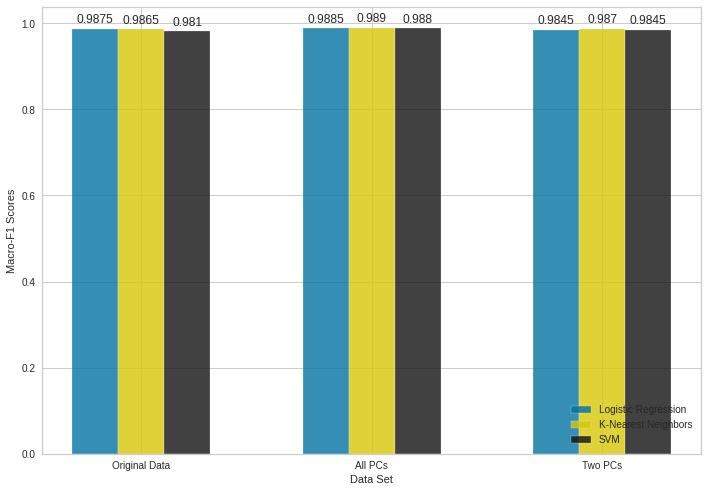

In [80]:
# ADAPTED FROM: https://matplotlib.org/3.1.1/gallery/lines_bars_and_markers/barchart.html
def autolabel(rects):
    for r in rects:
        height = r.get_height()
        ax.annotate(f'{height}', xy=(r.get_x() + r.get_width() / 2, height), xytext=(0, 3), textcoords="offset points", ha='center', va='bottom')

n_groups = 3
ind = np.arange(n_groups)

# F1 Scores from above
LR = (0.9875, 0.9885, 0.9845)
KNN = (0.9865, 0.9890, 0.987)
SVM = (0.981, 0.988, 0.9845)

# create plot
fig, ax = plt.subplots(figsize=(10,7))
index = np.arange(n_groups)
bar_width = 0.20
opacity = 0.8

rects1 = plt.bar(index, LR, bar_width, alpha=opacity, color='b', label='Logistic Regression')
rects2 = plt.bar(index + bar_width, KNN, bar_width, alpha=opacity, color='y', label='K-Nearest Neighbors')
rects3 = plt.bar(index + bar_width*2, SVM, bar_width, alpha=opacity, color='k', label='SVM')

ax.set_xlabel('Data Set')
ax.set_ylabel('Macro-F1 Scores')
#plt.title(f'')
plt.xticks(index + bar_width, ('Original Data', 'All PCs', 'Two PCs'))
plt.legend(loc="lower right")

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

plt.tight_layout()
plt.show()

#**Explainable AI with Shapley values**

Shapley values are a widely used approach from cooperative game theory that come with desirable properties.

In [81]:
!pip install shap

     |████████████████████████████████| 564 kB 32.8 MB/s 


In [82]:
import shap

In [83]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9817,0.9941,0.9872,0.9794,0.9833,0.9630,0.9630
1,0.9930,0.9980,0.9968,0.9905,0.9936,0.9859,0.9859
2,0.9965,0.9998,0.9984,0.9952,0.9968,0.9930,0.9930
3,0.9825,0.9971,0.9872,0.9810,0.9841,0.9648,0.9648
4,0.9869,0.9984,0.9872,0.9888,0.9880,0.9736,0.9736
5,0.9878,0.9983,0.9936,0.9842,0.9889,0.9753,0.9754
6,0.9852,0.9980,0.9856,0.9872,0.9864,0.9700,0.9700
7,0.9843,0.9990,0.9856,0.9856,0.9856,0.9683,0.9683
8,0.9878,0.9956,0.9952,0.9826,0.9889,0.9753,0.9754


In [84]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9843,0.9957,0.9920,0.9795,0.9857,0.9683,0.9684
1,0.9921,0.9984,0.9984,0.9874,0.9929,0.9841,0.9842
2,0.9930,0.9998,0.9984,0.9889,0.9937,0.9859,0.9860
3,0.9869,0.9989,0.9952,0.9811,0.9881,0.9735,0.9737
4,0.9878,0.9990,0.9920,0.9857,0.9889,0.9753,0.9754
5,0.9913,0.9985,0.9968,0.9874,0.9921,0.9824,0.9824
6,0.9869,0.9993,0.9936,0.9826,0.9881,0.9735,0.9736
7,0.9825,0.9985,0.9904,0.9779,0.9841,0.9647,0.9648
8,0.9869,0.9972,0.9920,0.9842,0.9881,0.9735,0.9736


**SHAP Summary Plot**

Rather than using a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. 

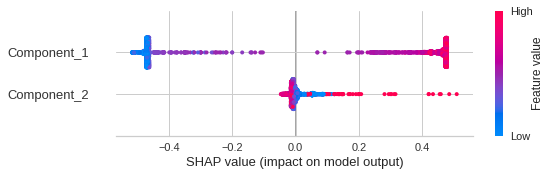

In [85]:
interpret_model(tuned_rf_pca, plot='summary')

In [86]:
#explainer = shap.TreeExplainer(tuned_rf_pca)
#X = df.drop('class', axis=1)
#shap_values = explainer.shap_values(X)
#shap.summary_plot(shap_values, X)

**Visualize a single prediction**

In [89]:
interpret_model(tuned_rf_pca, plot='reason', observation=15)

From the above the plot, we can seethe "base value," which is defined as the mean predicted target; and f(x), which is the prediction for a selected observation (i.e. observation number 32). The red-colored features increased the predicted value, while the blue-colored features decreased it. The size of each feature (i.e. Principal Component) indicates the impact it has on the model.

**Visualize many predictions**

In [ ]:
interpret_model(tuned_dt_pca, plot='reason')